### Will a Customer Accept the Coupon?

**Context**

Imagine driving through town and a coupon is delivered to your cell phone for a restaraunt near where you are driving. Would you accept that coupon and take a short detour to the restaraunt? Would you accept the coupon but use it on a sunbsequent trip? Would you ignore the coupon entirely? What if the coupon was for a bar instead of a restaraunt? What about a coffee house? Would you accept a bar coupon with a minor passenger in the car? What about if it was just you and your partner in the car? Would weather impact the rate of acceptance? What about the time of day?

Obviously, proximity to the business is a factor on whether the coupon is delivered to the driver or not, but what are the factors that determine whether a driver accepts the coupon once it is delivered to them? How would you determine whether a driver is likely to accept a coupon?

**Overview**

The goal of this project is to use what you know about visualizations and probability distributions to distinguish between customers who accepted a driving coupon versus those that did not.

**Data**

This data comes to us from the UCI Machine Learning repository and was collected via a survey on Amazon Mechanical Turk. The survey describes different driving scenarios including the destination, current time, weather, passenger, etc., and then ask the person whether he will accept the coupon if he is the driver. Answers that the user will drive there ‘right away’ or ‘later before the coupon expires’ are labeled as ‘Y = 1’ and answers ‘no, I do not want the coupon’ are labeled as ‘Y = 0’.  There are five different types of coupons -- less expensive restaurants (under \\$20), coffee houses, carry out & take away, bar, and more expensive restaurants (\\$20 - \\$50). 

**Deliverables**

Your final product should be a brief report that highlights the differences between customers who did and did not accept the coupons.  To explore the data you will utilize your knowledge of plotting, statistical summaries, and visualization using Python. You will publish your findings in a public facing github repository as your first portfolio piece. 





### Data Description
Keep in mind that these values mentioned below are average values.

The attributes of this data set include:
1. User attributes
    -  Gender: male, female
    -  Age: below 21, 21 to 25, 26 to 30, etc.
    -  Marital Status: single, married partner, unmarried partner, or widowed
    -  Number of children: 0, 1, or more than 1
    -  Education: high school, bachelors degree, associates degree, or graduate degree
    -  Occupation: architecture & engineering, business & financial, etc.
    -  Annual income: less than \\$12500, \\$12500 - \\$24999, \\$25000 - \\$37499, etc.
    -  Number of times that he/she goes to a bar: 0, less than 1, 1 to 3, 4 to 8 or greater than 8
    -  Number of times that he/she buys takeaway food: 0, less than 1, 1 to 3, 4 to 8 or greater
    than 8
    -  Number of times that he/she goes to a coffee house: 0, less than 1, 1 to 3, 4 to 8 or
    greater than 8
    -  Number of times that he/she eats at a restaurant with average expense less than \\$20 per
    person: 0, less than 1, 1 to 3, 4 to 8 or greater than 8
    -  Number of times that he/she goes to a bar: 0, less than 1, 1 to 3, 4 to 8 or greater than 8
    

2. Contextual attributes
    - Driving destination: home, work, or no urgent destination
    - Location of user, coupon and destination: we provide a map to show the geographical
    location of the user, destination, and the venue, and we mark the distance between each
    two places with time of driving. The user can see whether the venue is in the same
    direction as the destination.
    - Weather: sunny, rainy, or snowy
    - Temperature: 30F, 55F, or 80F
    - Time: 10AM, 2PM, or 6PM
    - Passenger: alone, partner, kid(s), or friend(s)


3. Coupon attributes
    - time before it expires: 2 hours or one day

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import plotly.express as px

### Problems

Use the prompts below to get started with your data analysis.  

1. Read in the `coupons.csv` file.




In [6]:
data = pd.read_csv('/Users/Sheikh/Documents/0ML/mod5/assignment_5_1_starter/data/coupons.csv')

In [10]:
data.head(20)

,destination,passanger,weather,temperature,time,coupon,expiration,gender,age,maritalStatus,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Y
0,No Urgent Place,Alone,Sunny,55,2PM,Restaurant(<20),1d,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,10AM,Coffee House,2h,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,10AM,Carry out & Take away,2h,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,2PM,Coffee House,2h,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,2PM,Coffee House,1d,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,1,0,0,1,0
5,No Urgent Place,Friend(s),Sunny,80,6PM,Restaurant(<20),2h,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,1,0,0,1,1
6,No Urgent Place,Friend(s),Sunny,55,2PM,Carry out & Take away,1d,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,1,0,0,1,1
7,No Urgent Place,Kid(s),Sunny,80,10AM,Restaurant(<20),2h,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,1,0,0,1,1
8,No Urgent Place,Kid(s),Sunny,80,10AM,Carry out & Take away,2h,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,1,0,0,1,1
9,No Urgent Place,Kid(s),Sunny,80,10AM,Bar,1d,Female,21,Unmarried partner,...,never,NaN,4~8,1~3,1,1,0,0,1,0


2. Investigate the dataset for missing or problematic data.

In [9]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12684 entries, 0 to 12683
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   destination           12684 non-null  object
 1   passanger             12684 non-null  object
 2   weather               12684 non-null  object
 3   temperature           12684 non-null  int64 
 4   time                  12684 non-null  object
 5   coupon                12684 non-null  object
 6   expiration            12684 non-null  object
 7   gender                12684 non-null  object
 8   age                   12684 non-null  object
 9   maritalStatus         12684 non-null  object
 10  has_children          12684 non-null  int64 
 11  education             12684 non-null  object
 12  occupation            12684 non-null  object
 13  income                12684 non-null  object
 14  car                   108 non-null    object
 15  Bar                   12577 non-null

3. Decide what to do about your missing data -- drop, replace, other...

In [15]:
df= data.fillna(0)
df

,destination,passanger,weather,temperature,time,coupon,expiration,gender,age,maritalStatus,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Y
0,No Urgent Place,Alone,Sunny,55,2PM,Restaurant(<20),1d,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,10AM,Coffee House,2h,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,10AM,Carry out & Take away,2h,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,2PM,Coffee House,2h,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,2PM,Coffee House,1d,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12679,Home,Partner,Rainy,55,6PM,Carry out & Take away,1d,Male,26,Single,...,never,1~3,4~8,1~3,1,0,0,1,0,1
12680,Work,Alone,Rainy,55,7AM,Carry out & Take away,1d,Male,26,Single,...,never,1~3,4~8,1~3,1,0,0,0,1,1
12681,Work,Alone,Snowy,30,7AM,Coffee House,1d,Male,26,Single,...,never,1~3,4~8,1~3,1,0,0,1,0,0
12682,Work,Alone,Snowy,30,7AM,Bar,1d,Male,26,Single,...,never,1~3,4~8,1~3,1,1,1,0,1,0


4. What proportion of the total observations chose to accept the coupon? 

of the 12683 reocrds only 7210 accepted the coupon see below

In [33]:
df2 = df.query("Y == 1")
rowcountdf2 = df2.shape[0]
rowcountdf2

7210

5. Use a bar plot to visualize the `coupon` column.

In [50]:
barplot = px.bar(df, x='coupon', color="coupon", title="Coupons" )
barplot.show()

6. Use a histogram to visualize the temperature column.

In [51]:
fig = px.histogram(df, x="temperature")
fig.show()

,destination,passanger,weather,temperature,time,coupon,expiration,gender,age,maritalStatus,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Y
0,No Urgent Place,Alone,Sunny,55,2PM,Restaurant(<20),1d,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,10AM,Coffee House,2h,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,10AM,Carry out & Take away,2h,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,2PM,Coffee House,2h,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,2PM,Coffee House,1d,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,0
5,No Urgent Place,Friend(s),Sunny,80,6PM,Restaurant(<20),2h,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,1
6,No Urgent Place,Friend(s),Sunny,55,2PM,Carry out & Take away,1d,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,1
7,No Urgent Place,Kid(s),Sunny,80,10AM,Restaurant(<20),2h,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,1
9,No Urgent Place,Kid(s),Sunny,80,10AM,Bar,1d,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,1,0,0,1,0
15,Home,Alone,Sunny,80,6PM,Coffee House,2h,Female,21,Unmarried partner,...,never,0,4~8,1~3,1,0,0,0,1,0


**Investigating the Bar Coupons**

Now, we will lead you through an exploration of just the bar related coupons.  

1. Create a new `DataFrame` that contains just the bar coupons.


Text(0.5, 1.0, '0 = No to Coupon 1 = Yes to Coupon')

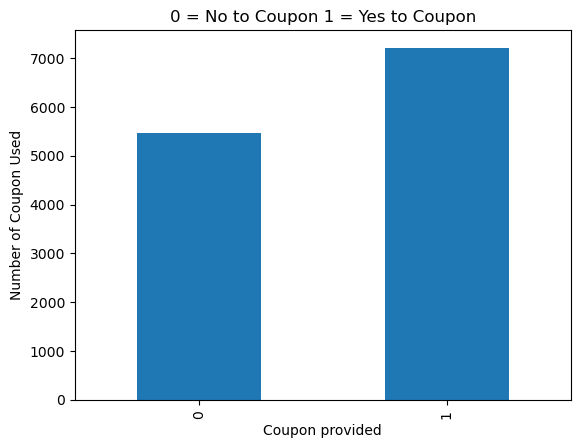

In [60]:
df.groupby('Y')['Y'].count().plot(kind='bar')
plt.xlabel("Coupon provided")
plt.ylabel("Number of Coupon Used")
plt.title("0 = No to Coupon 1 = Yes to Coupon")

2. What proportion of bar coupons were accepted?


In [97]:
barC = df.query("coupon == 'Bar' and Y == 1" )
countBarC =barC['Y'].count()
barCAll = df.query("coupon == 'Bar'")
barCAllCount = barCAll['Y'].count() 
proportioncount =   countBarC/ barCAllCount ##barCC
print( "Proportaion of bar Coupon  =" + str(proportioncount))

Proportaion of bar Coupon  =0.41001487357461575


3. Compare the acceptance rate between those who went to a bar 3 or fewer times a month to those who went more.


In [160]:
dfbar = df['Bar'].unique()
print(dfbar)
threeOrlessBarCount = df.query("Bar in ('1~3', 'less1') and coupon == 'Bar' and (Y == 1)")['Y'].count()
more3BarCount = df.query("Bar in(  'gt8' , '4~8')and coupon == 'Bar' and (Y == 1)")['Y'].count()
TotalBarCount = df.query("Bar in(  'less1' ,'1~3' ,'gt8', '4~8') and coupon == 'Bar' and (Y == 1)")['Y'].count()

#barVisit = threeOrlessBarCount['Y'].count()
print( "Bar count of more than 3: "+ str(more3BarCount))
print( "Bar count of  3 or less: "+ str(threeOrlessBarCount))
print( "Total for all Bar count of  less than one 1 or 3 or less or 4-8 or 8 or more: "+ str(TotalBarCount))
print( "Rate of Bar count of  3 or less: "+ str(threeOrlessBarCount/TotalBarCount))
print( "Rate of Bar count of  4 or more: "+ str(more3BarCount/TotalBarCount))



['never' 'less1' '1~3' 'gt8' 0 '4~8']
Bar count of more than 3: 153
Bar count of  3 or less: 510
Total for all Bar count of  less than one 1 or 3 or less or 4-8 or 8 or more: 663
Rate of Bar count of  3 or less: 0.7692307692307693
Rate of Bar count of  4 or more: 0.23076923076923078


### Rate for Visiting the bar 3 times or fewer is greater then compare to 4 times or more.

4. Compare the acceptance rate between drivers who go to a bar more than once a month and are over the age of 25 to the all others.  Is there a difference?


In [171]:
#Checking unique ages
dfAgeUnique = df['age'].unique()
print("Unique Ages:"+ str(dfAgeUnique))

age25orMoreBar1ormoreCount = df.query("Bar in ('1~3' , 'gt8' , '4~8') and coupon == 'Bar' and age in ('46','26','31','41','50plus','36') and (Y == 1) ")['Y'].count()
print("Accepted Age 25 or More Bar visit 1 or times Count: "+ str(age25orMoreBar1ormoreCount))
allOthersBarVisitCount = df.query("Bar in ( 0, 'never','less1') and coupon == 'Bar' and (Y == 1) ")['Y'].count()
print("Accepted All Others Bar Visit Count: "+ str(allOthersBarVisitCount))
totalAccepteanceVisitCount = df.query(" coupon == 'Bar' and Y == 1 ")['Y'].count()
print( "Total Count of coupon Bar: " +str(totalAccepteanceVisitCount))
print("Rate of Acceptance Bar visit between age 25 and more: "+ str( age25orMoreBar1ormoreCount/totalAccepteanceVisitCount))
print("Rate of Accepteance Bar visit between age of 0 or less1 and never: "+ str( allOthersBarVisitCount/totalAccepteanceVisitCount))


Unique Ages:['21' '46' '26' '31' '41' '50plus' '36' 'below21']
Accepted Age 25 or More Bar visit 1 or times Count: 292
Accepted All Others Bar Visit Count: 417
Total Count of coupon Bar827
Rate of Acceptance Bar visit between age 25 and more: 0.35308343409915355
Rate of Accepteance Bar visit between age of 0 or less1 and never: 0.5042321644498187


### Rate of all others acceptence is greater.

5. Use the same process to compare the acceptance rate between drivers who go to bars more than once a month and had passengers that were not a kid and had occupations other than farming, fishing, or forestry. 


In [163]:
#Checking unique ages
passangerUnique = df['passanger'].unique()
print("Unique Ages:"+ str(passangerUnique))
occupationUnique = df['occupation'].unique()
print("Unique Ages:"+ str(occupationUnique))

notKidsMorethan1VisitCount = df.query("Bar in ('1~3' , 'gt8' , '4~8') and coupon == 'Bar' and passanger != 'Kid(s)' and  occupation not in ('Farming Fishing & Forestry') and (Y == 1) ")['Y'].count()
print("Acceptence not Kids More than 1 Visit and Occupation not Farming, Fishing & Forestory (FFF): "+ str(notKidsMorethan1VisitCount))

print("Rate of Acceptance Not Kids as passanger, more then one Bar visit and Occupation not FFF : "+ str( notKidsMorethan1VisitCount/totalAccepteanceVisitCount))


Unique Ages:['Alone' 'Friend(s)' 'Kid(s)' 'Partner']
Unique Ages:['Unemployed' 'Architecture & Engineering' 'Student'
 'Education&Training&Library' 'Healthcare Support'
 'Healthcare Practitioners & Technical' 'Sales & Related' 'Management'
 'Arts Design Entertainment Sports & Media' 'Computer & Mathematical'
 'Life Physical Social Science' 'Personal Care & Service'
 'Community & Social Services' 'Office & Administrative Support'
 'Construction & Extraction' 'Legal' 'Retired'
 'Installation Maintenance & Repair' 'Transportation & Material Moving'
 'Business & Financial' 'Protective Service'
 'Food Preparation & Serving Related' 'Production Occupations'
 'Building & Grounds Cleaning & Maintenance' 'Farming Fishing & Forestry']
Acceptence not Kids More than 1 Visit and Occupation not Farming, Fishing & Forestory (FFF): 393
Rate of Acceptance Not Kids as passanger, more then one Bar visit and Occupation not FFF : 0.4752116082224909


6. Compare the acceptance rates between those drivers who:

- go to bars more than once a month, had passengers that were not a kid, and were not widowed *OR*
- go to bars more than once a month and are under the age of 30 *OR*
- go to cheap restaurants more than 4 times a month and income is less than 50K. 



In [173]:
#Checking unique 
mstatusUnique = df['maritalStatus'].unique()
print("Unique Marital Status: "+ str(mstatusUnique))

incomeUnique = df['income'].unique()
print("Unique Marital income: "+ str(incomeUnique))

restaurantLessThan20unique = df['RestaurantLessThan20'].unique()
print("Unique restaurantLessThan20 : "+ str(restaurantLessThan20unique))

notKidsMorethan1VisitWindowedCount = df.query("Bar in ('1~3' , 'gt8' , '4~8') and coupon == 'Bar' and passanger != 'Kid(s)' and maritalStatus != 'widowed' and (Y == 1) ")['Y'].count()
print("Acceptence not Kids More than 1 Visit and Widowed : "+ str(notKidsMorethan1VisitWindowedCount))

morethan1Visitunder30Count = df.query("Bar in ('1~3' , 'gt8' , '4~8') and coupon == 'Bar' and age in ('21' ,'26', 'below21') and  (Y == 1) ")['Y'].count()
print("More then one Bar visit and Age under 30 Count : "+ str( morethan1Visitunder30Count))

restaurantless20Income50klessCount = df.query("  RestaurantLessThan20 in ('4~8' , 'gt8') and coupon == 'Restaurant(<20)' and income in ('$37500 - $49999', '$12500 - $24999', '$25000 - $37499', 'Less than $12500') and (Y == 1) ")['Y'].count()
print("Acceptence restaurant less than 20 Income 50k or less Count: "+ str(restaurantless20Income50klessCount))

totalAccepteanceResturant20VisitCount = df.query(" coupon == 'Restaurant(<20)' and Y == 1 ")['Y'].count()

print("Rate of Acceptance not Kids More than 1 Visit and not Widowed : "+ str( notKidsMorethan1VisitWindowedCount/totalAccepteanceVisitCount))

print("Rate of Acceptance More then one Bar visit and Age under 30 : "+ str( morethan1Visitunder30Count/totalAccepteanceVisitCount))

print("Rate of Acceptance restaurant less than 20 Income 50k or less : "+ str( restaurantless20Income50klessCount/totalAccepteanceResturant20VisitCount))
 

Unique Marital Status: ['Unmarried partner' 'Single' 'Married partner' 'Divorced' 'Widowed']
Unique Marital income: ['$37500 - $49999' '$62500 - $74999' '$12500 - $24999' '$75000 - $87499'
 '$50000 - $62499' '$25000 - $37499' '$100000 or More' '$87500 - $99999'
 'Less than $12500']
Unique restaurantLessThan20 : ['4~8' '1~3' 'less1' 'gt8' 0 'never']
Acceptence not Kids More than 1 Visit and Widowed : 393
More then one Bar visit and Age under 30 Count : 249
Acceptence restaurant less than 20 Income 50k or less Count: 359
Rate of Acceptance not Kids More than 1 Visit and not Widowed : 0.4752116082224909
Rate of Acceptance More then one Bar visit and Age under 30 : 0.3010882708585248
Rate of Acceptance restaurant less than 20 Income 50k or less : 0.18223350253807108


7.  Based on these observations, what do you hypothesize about drivers who accepted the bar coupons?

### -- People who go to bars more than once a month, had passengers that were not a kid, and were not widowed  are more accpeting to the coupons and using them 

### -- People who go to bars more than once a month and are under the age of 30  fall in the middle with acceptance of .30.

### -- People who go to cheap restaurants more than 4 times a month and income is less than 50 are least likly to accept accept coupon and use it

### Independent Investigation

Using the bar coupon example as motivation, you are to explore one of the other coupon groups and try to determine the characteristics of passengers who accept the coupons.  

In [191]:
overallAcceptenceCount = df.query("  (Y == 1) ")['Y'].count()
print("Acceptence with Y==1 Count: "+ str(overallAcceptenceCount))

overallCountTotal = df['Y'].count()
print("Acceptence Total Count: "+ str(overallCountTotal))

print("Overall Acceptence rate is good at : "+ str((overallAcceptenceCount/overallCountTotal)*100)+" %")


Acceptence with Y==1 Count: 7210
Acceptence Total Count: 12684
Overall Acceptence rate is good at : 56.84326710816777 %


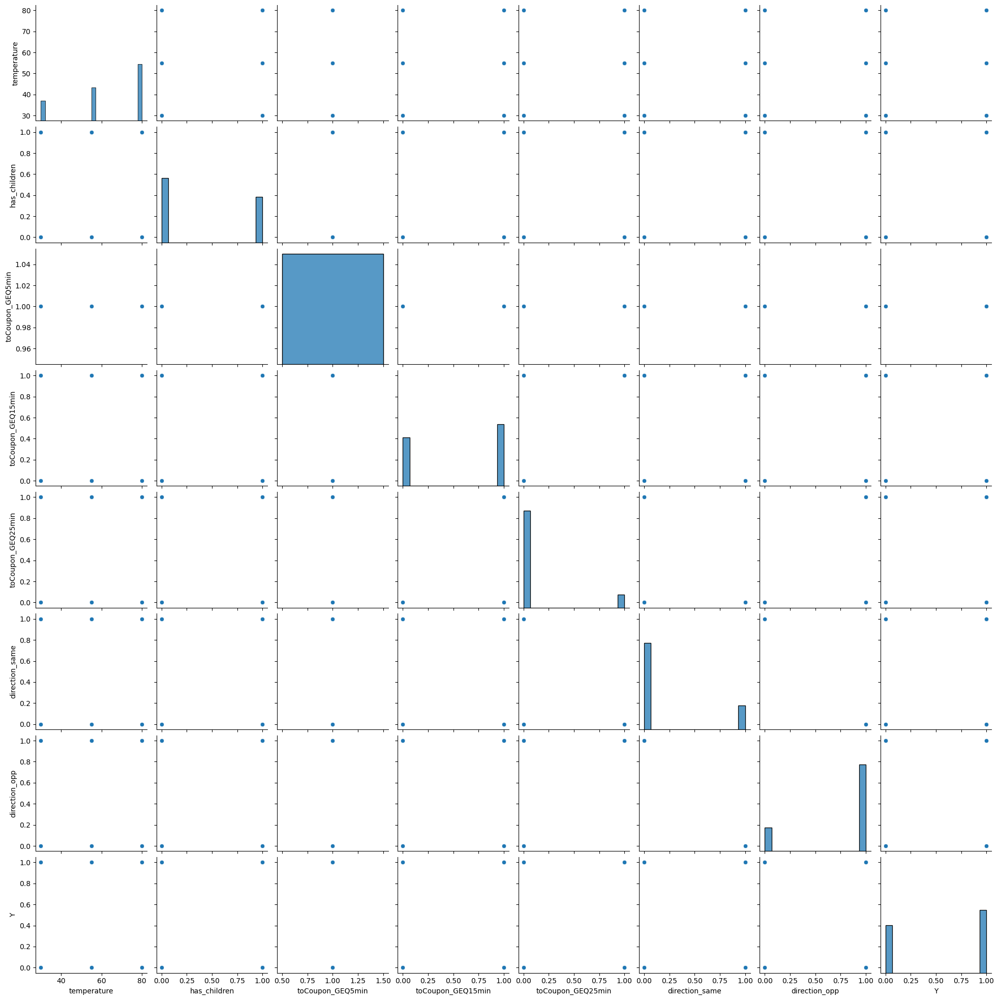

In [174]:
sns.pairplot(df)

In [175]:
fig = px.imshow(df, text_auto=True)
fig.show()

#### The above imshow  is interactive graph with zoom features. 


<Axes: >

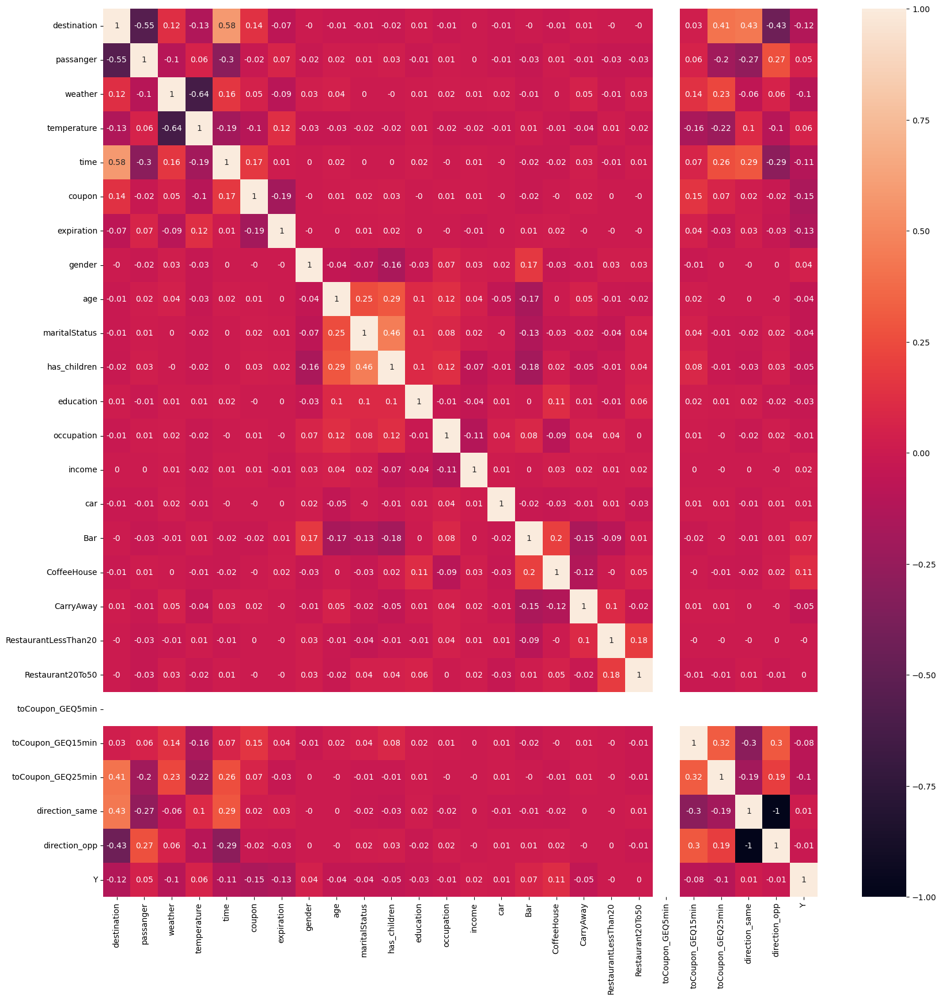

In [178]:
# creating numeric data frame
df_c = df.copy()
for column in df.select_dtypes(include='object').columns.tolist():
    df_c[column] = pd.factorize(df_c[column])[0]

corr=df_num.corr()
plt.figure(figsize=(20,20))
sns.heatmap(corr.round(2),annot=True)

### Heatmap above shows the corelation between each column.
Things that are obvious with 

#### strong positive correlation 
destination to direction_opp 
Weather to Temperature

#### Negative correlation
direction_same to direction_opp
